# Tutorial 1: Low-level image reconstruction from fMRI (NSD)

In this notebook, we build a minimal low-level decoding baseline: predicting image appearance from fMRI by mapping voxel patterns to a compressed visual latent space.

We'll load NSD samples (voxels, images, trial IDs), encode images into Stable Diffusion VAE latents (4,096 numbers instead of 196,608 pixels), and fit two decoders: Ridge regression (linear baseline) and a simple MLP (nonlinear baseline). Then we'll decode the predicted latents back to images and evaluate reconstructions with SSIM and pixel errors.

This is **low-level reconstruction**—we aim to recover color and coarse spatial structure. There's no text prior, no diffusion sampling, and no semantic guidance. The best possible reconstruction here is capped by what the VAE can represent and decode.




In [1]:
!pip -q install diffusers transformers accelerate open_clip_torch pytorch_msssim kornia webdataset braceexpand optuna


In [5]:
# Standard libs
import os
from pathlib import Path
from typing import Tuple, Optional, Literal

# Numeric + torch
import numpy as np
import torch
from torch.utils.data import DataLoader

# Download + dataset streaming
import requests
import braceexpand
import webdataset as wds
from dataclasses import dataclass

# Progress bars + plotting (only if you actually plot)
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [ ]:
#Seeding is important for reproducibility
def set_seed(seed: int) -> None:
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [ ]:
from dataclasses import dataclass

@dataclass(frozen=True)
class LowLevelCfg:
    subject_id: int = 1
    seed: int = 42

    # streaming
    batch_size: int = 64
    num_workers: int = 4    # Increased to 4 for faster downloads

    # low-level target
    img_size: int = 256
    vae_id: str = "stabilityai/sd-vae-ft-mse"  # SD VAE

    # ridge - lower alpha = less shrinkage = more variance in predictions
    ridge_alpha: float = 1e5

ll = LowLevelCfg()
print(ll)


### Streaming Data Loading

The NSD dataset is too large to download entirely, so instead we use **streaming data loading** with WebDataset. This approach fetches data on-demand from HuggingFace as needed, ensuring that only batches currently being processed are held in memory. The system supports efficient parallel loading with multiple workers, allowing us to process data faster while maintaining low memory footprint.

The `build_nsd_dataset` function creates a complete pipeline that downloads shards from HuggingFace, decodes the compressed data containing images, voxels, and trial IDs, batches samples together for efficient processing, and shuffles training data to improve learning. This streaming approach allows us to work with datasets that far exceed available RAM, making it possible to process large-scale fMRI datasets without requiring massive local storage or memory.


In [7]:
PROJECT_DIR = Path.cwd()
RESULTS_DIR = PROJECT_DIR / "results"
CACHE_DIR = PROJECT_DIR / "cache"

RESULTS_DIR.mkdir(parents=True, exist_ok=True)
CACHE_DIR.mkdir(parents=True, exist_ok=True)

print(f"RESULTS_DIR: {RESULTS_DIR}")
print(f"CACHE_DIR: {CACHE_DIR}")



RESULTS_DIR: /content/results
CACHE_DIR: /content/cache


In [9]:
VoxelSelectMode = Literal["as_is", "mean", "random_select", "random_weighted", "mixed"]

def voxel_select(
    voxels: torch.Tensor,
    mode: VoxelSelectMode = "as_is",
    p: Tuple[float, float, float] = (0.5, 0.3, 0.2),
    generator: Optional[torch.Generator] = None,
) -> torch.Tensor:
    """
    Select or combine repeated voxel responses.
    Expected shapes:
    - [B, V]        already selected
    - [B, R, V]     R repeats per sample

    Returns:
    - [B, V]
    """
    if voxels.ndim == 2:
        return voxels

    if voxels.ndim != 3:
        raise ValueError(f"voxels must have shape [B,V] or [B,R,V], got {tuple(voxels.shape)}")

    B, R, V = voxels.shape

    if mode == "as_is":
        return voxels.mean(dim=1)

    if mode == "mean":
        return voxels.mean(dim=1)

    if mode == "random_select":
        idx = torch.randint(0, R, (B,), device=voxels.device, generator=generator)
        return voxels[torch.arange(B, device=voxels.device), idx]

    if mode == "random_weighted":
        w = torch.rand((B, R, 1), device=voxels.device, generator=generator)
        return (w * voxels).sum(dim=1) / w.sum(dim=1).clamp_min(1e-8)

    if mode == "mixed":
        u = torch.rand((), device=voxels.device, generator=generator).item()
        pw, pm, pr = p
        if u < pw:
            return voxel_select(voxels, mode="random_weighted", generator=generator)
        if u < pw + pm:
            return voxel_select(voxels, mode="mean", generator=generator)
        return voxel_select(voxels, mode="random_select", generator=generator)

    raise ValueError(f"Unknown mode: {mode}")


In [ ]:
# --- Helper to build the streaming dataset ---
def build_nsd_dataset(
    subject_id: int,
    split: str,
    batch_size: int
):
    """
    Creates a streaming WebDataset pipeline.
    split: 'train', 'val', or 'test'
    """
    # Use 'resolve' for direct file access
    base_url = "https://huggingface.co/datasets/pscotti/naturalscenesdataset/resolve/main/webdataset_avg_new"

    if split == "train":
        # pattern: train/train_subj0X_{0..17}.tar
        url_pattern = f"{base_url}/train/train_subj0{subject_id}_{{0..17}}.tar"
    elif split == "val":
        # pattern: val/val_subj0X_0.tar
        url_pattern = f"{base_url}/val/val_subj0{subject_id}_0.tar"
    elif split == "test":
        # pattern: test/test_subj0X_{0..1}.tar
        url_pattern = f"{base_url}/test/test_subj0{subject_id}_{{0..1}}.tar"
    else:
        raise ValueError(f"Unknown split: {split}")

    urls = list(braceexpand.braceexpand(url_pattern))

    dataset = wds.WebDataset(urls, resampled=False)

    if split == "train":
        # Shuffle training data
        dataset = dataset.shuffle(100)

    dataset = (
        dataset
        .decode("torch")
        .rename(images="jpg;png", voxels="nsdgeneral.npy", trial="trial.npy")
        .to_tuple("voxels", "images", "trial")
        .batched(batch_size, partial=(split != "train"))
    )

    return dataset

# --- Main Loading Function ---
def get_dataloaders(cfg: LowLevelCfg):
    print(f"Setting up streaming dataloaders for Subject {cfg.subject_id}...")

    # 1. Train Loader
    # Train has ~18 shards, so multiple workers work well.
    train_ds = build_nsd_dataset(cfg.subject_id, "train", cfg.batch_size)
    train_loader = wds.WebLoader(
        train_ds,
        batch_size=None, # Batching is handled in the dataset pipeline
        num_workers=cfg.num_workers,
        pin_memory=True
    )

    # 2. Validation Loader
    # Val has only 1 shard. Using num_workers > 1 causes "No samples" error in empty workers.
    # We use num_workers=0 to run in the main process.
    val_ds = build_nsd_dataset(cfg.subject_id, "val", cfg.batch_size)
    val_loader = wds.WebLoader(
        val_ds,
        batch_size=None,
        num_workers=0,
        pin_memory=True
    )

    # 3. Test Loader
    # Test has 2 shards. To be safe and simple, we also use 0 workers.
    test_ds = build_nsd_dataset(cfg.subject_id, "test", cfg.batch_size)
    test_loader = wds.WebLoader(
        test_ds,
        batch_size=None,
        num_workers=0,
        pin_memory=True
    )

    print(f"Loaders ready. Batch size: {cfg.batch_size}")
    return train_loader, val_loader, test_loader

### Materializing Data from Streams

While streaming is efficient, we need to **materialize** (load into memory) the data for training:

- **Training set**: ~8,640 samples (each shown 3 times = 25,920 total presentations)
- **Validation set**: 300 samples
- **Test set**: 1,000 samples

The `take_n_samples` function:
- Iterates through the streaming loader
- Converts images to uint8 format (saves 4x memory vs float32)
- Shuffles data in memory for randomness
- Returns voxels, images, and trial IDs

Note: Each sample has shape `[3, 15724]` for voxels because each image was shown 3 times. We'll handle this repetition differently for Ridge vs MLP models.


🌊 Setting up streaming dataloaders for Subject 1...
✅ Loaders ready. Batch size: 64
Fetching one batch...


/usr/local/lib/python3.12/dist-packages/webdataset/compat.py:379: UserWarning: WebDataset(shardshuffle=...) is None; set explicitly to False or a number
  warnings.warn("WebDataset(shardshuffle=...) is None; set explicitly to False or a number")


Voxel Shape: torch.Size([64, 3, 15724])
Image Shape: torch.Size([64, 3, 224, 224])


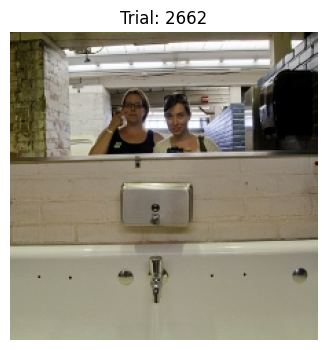

In [ ]:
# --- Usage Example ---
train_loader, val_loader, test_loader = get_dataloaders(ll)

# Visualize one batch to verify
print("Fetching one batch...")
for voxels, images, trials in train_loader:
    print(f"Voxel Shape: {voxels.shape}") # [B, Num_Voxels]
    print(f"Image Shape: {images.shape}") # [B, C, H, W]

    # Plotting
    plt.figure(figsize=(4, 4))
    plt.imshow(images[0].permute(1, 2, 0))
    plt.title(f"Trial: {trials[0].item()}")
    plt.axis("off")
    plt.show()
    break

## Part 1: Data loading and preprocessing

**Goal:** produce three clean tensors for each split:
- `X`: fMRI voxels (one vector per trial)
- `I`: stimulus image
- `trial_id`: lets us group repeated presentations of the same stimulus

**What matters for decoding**
- fMRI is noisy, and repeats are your friend.
- We will use repeats in two different ways:
  1) **Average repeats** to get a lower-noise target for the linear baseline.
  2) **Expand repeats** as extra samples for the nonlinear model.


### Dataset snapshot (NSD, decoding view)

For each trial we have:
- a **single** image (resized to `256×256` here)
- an fMRI response vector from visual cortex (about 15k voxels in your setup)
- a `trial_id` so we can identify repeats of the same image

**Splits**
- Train and validation are used for fitting and model selection.
- Test is held out until the end for the final numbers and qualitative examples.


### Configuration

We keep configuration in one place so the tutorial is easy to rerun and modify.

Key settings:
- `vae_id`: which VAE defines the latent space you are trying to predict.
- `img_size`: reconstruction resolution used for decoding and metrics.
- `ridge_alpha`: regularization strength for the linear baseline.
- `batch_size / num_workers`: streaming performance controls.


In [12]:
from dataclasses import dataclass

@dataclass(frozen=True)
class LowLevelCfg:
    subject_id: int = 1
    seed: int = 42

    # streaming
    batch_size: int = 64
    num_workers: int = 4    # Increased to 4 for faster downloads

    # low-level target
    img_size: int = 256
    vae_id: str = "stabilityai/sd-vae-ft-mse"  # SD VAE

    # ridge - lower alpha = less shrinkage = more variance in predictions
    ridge_alpha: float = 1e5

ll = LowLevelCfg()
print(ll)

LowLevelCfg(subject_id=1, seed=42, batch_size=64, num_workers=4, img_size=256, vae_id='stabilityai/sd-vae-ft-mse', ridge_alpha=100000.0)


In [13]:
import torch

def to_vae_range(images: torch.Tensor) -> torch.Tensor:
    """
    images: [B,3,H,W], uint8 or float
    returns float32 in [-1,1]
    """
    x = images
    if x.dtype != torch.float32:
        x = x.float()
    if x.max() > 1.5:
        x = x / 255.0
    x = x.clamp(0, 1)
    x = x * 2 - 1
    return x


## Materializing a streaming dataset (why we do it)

NSD (and NSD-derived WebDataset dumps) can be too large to treat like a normal in-memory dataset.
We stream batches from disk or the network, and only "materialize" what we actually need for this tutorial.

**Why materialize at all?**
- For model fitting we often want simple tensors: `X` for voxels, `I` for images, and `trial_id` for grouping repeats.
- We also want deterministic train, val, test splits that do not change across runs.

**Memory tip used below**
- Images are converted to `uint8` early to reduce RAM.

::: {note}
In this tutorial, "materialize" just means: iterate once and stack into tensors.
It is the simplest way to keep the rest of the notebook readable.
:::


In [14]:
import numpy as np
from tqdm.auto import tqdm

def take_n_samples(loader, n_samples=None, seed=42):
    """
    Takes n_samples from a streaming WebLoader.
    If n_samples is None, takes all available samples.
    Returns:
      X: [N,V], images: [N,3,H,W] (uint8), trials: [N]
    """
    set_seed(seed)

    xs, ims, trs = [], [], []
    n = 0

    # Add a progress bar. If n_samples is None, total is unknown.
    pbar = tqdm(total=n_samples, desc="Materializing samples", unit="samples")

    for vox, img, trial in loader:
        # Optimize memory: Convert images to uint8 immediately (saves 4x RAM)
        # img comes in as float [0,1]. Scale to [0,255] and cast.
        if img.dtype == torch.float32:
            img = (img * 255).clamp(0, 255).to(torch.uint8)

        b = vox.shape[0]
        xs.append(vox.cpu()) # Keep on CPU to save GPU memory
        ims.append(img.cpu())
        trs.append(trial.cpu())
        n += b
        pbar.update(b)

        if n_samples is not None and n >= n_samples:
            break

    pbar.close()

    if not xs:
        raise ValueError("Loader yielded no data!")

    X = torch.cat(xs, dim=0)
    I = torch.cat(ims, dim=0)
    T = torch.cat(trs, dim=0)

    if n_samples is not None:
        X = X[:n_samples]
        I = I[:n_samples]
        T = T[:n_samples]

    # Shuffle in memory
    perm = torch.randperm(X.shape[0])
    X = X[perm]
    I = I[perm]
    T = T[perm]

    return X, I, T

In [ ]:
# 1. Refresh global dataloaders with the updated config (ll)
train_loader, val_loader, test_loader = get_dataloaders(ll)

# 2. Materialize Data (Using optimized uint8 storage)
# We pass n_samples=None to consume the entire dataset defined by the loaders
print("Materializing Training Data...")
Xtr, Itr, Ttr = take_n_samples(train_loader, n_samples=None, seed=ll.seed)
print("Materializing Validation Data...")
Xva, Iva, Tva = take_n_samples(val_loader,   n_samples=None,   seed=ll.seed + 1)
print("Materializing Test Data...")
Xte, Ite, Tte = take_n_samples(test_loader,  n_samples=None,  seed=ll.seed + 2)

print("Xtr:", Xtr.shape, "Itr:", Itr.shape)
print("Xva:", Xva.shape, "Iva:", Iva.shape)
print("Xte:", Xte.shape, "Ite:", Ite.shape)

🌊 Setting up streaming dataloaders for Subject 1...
✅ Loaders ready. Batch size: 64
Materializing Training Data...


Materializing samples: 0samples [00:00, ?samples/s]

Materializing Validation Data...


Materializing samples: 0samples [00:00, ?samples/s]

Materializing Test Data...


Materializing samples: 0samples [00:00, ?samples/s]

Xtr: torch.Size([8640, 3, 15724]) Itr: torch.Size([8640, 3, 224, 224])
Xva: torch.Size([300, 3, 15724]) Iva: torch.Size([300, 3, 224, 224])
Xte: torch.Size([1000, 3, 15724]) Ite: torch.Size([1000, 3, 224, 224])


In [ ]:
# --- Prepare TWO versions of voxel data ---
# AVERAGED: For Ridge regression (reduces noise, better linear fit)
# EXPANDED: For MLPs (use all repeats as separate samples = 3x more data!)

print(f"Original shape: {Xtr.shape}  (N samples × 3 repeats × V voxels)")
N_tr, R, V = Xtr.shape

# --- 1. AVERAGED version for Ridge ---
print("\nCreating AVERAGED data for Ridge...")
Xtr_avg = voxel_select(Xtr, mode="mean")  # [N, V]
Xva_avg = voxel_select(Xva, mode="mean")
Xte_avg = voxel_select(Xte, mode="mean")
print(f"   Xtr_avg: {Xtr_avg.shape}")

# --- 2. EXPANDED version for MLPs (3x more samples!) ---
# Each repeat sees the SAME image, so we only expand voxels here
# The latents (Ztr_exp) will be replicated later - no extra VAE encoding needed!
print("\nCreating EXPANDED voxels for MLPs (3x samples)...")
Xtr_exp_raw = Xtr.view(N_tr * R, V)  # [N*3, V]
print(f"   Xtr_exp: {Xtr_exp_raw.shape} ({N_tr} samples × {R} repeats = {N_tr * R} total)")

# Validation/test: use averaged (cleaner evaluation)
Xva = Xva_avg
Xte = Xte_avg

# Ridge uses averaged
Xtr = Xtr_avg

def zscore_train_apply(Xtr, Xva, Xte, eps=1e-6):
    # Calculate stats on training set only
    mu = Xtr.mean(dim=0, keepdim=True)
    sd = Xtr.std(dim=0, keepdim=True).clamp_min(eps)
    return (Xtr - mu) / sd, (Xva - mu) / sd, (Xte - mu) / sd, mu, sd

# Apply Z-score to averaged data (for Ridge)
Xtr, Xva, Xte, Xmu, Xsd = zscore_train_apply(Xtr.float(), Xva.float(), Xte.float())

# Apply Z-score to expanded data (for MLPs) using SAME stats
Xtr_exp = (Xtr_exp_raw.float() - Xmu) / Xsd

print(f"\nRidge will use: Xtr {Xtr.shape} (averaged)")
print(f"MLPs will use:  Xtr_exp {Xtr_exp.shape} (3x samples!)")

Original shape: torch.Size([8640, 3, 15724])  (N samples × 3 repeats × V voxels)

📊 Creating AVERAGED data for Ridge...
   Xtr_avg: torch.Size([8640, 15724])

📊 Creating EXPANDED voxels for MLPs (3x samples)...
   Xtr_exp: torch.Size([25920, 15724]) (8640 samples × 3 repeats = 25920 total)

✅ Ridge will use: Xtr torch.Size([8640, 15724]) (averaged)
✅ MLPs will use:  Xtr_exp torch.Size([25920, 15724]) (3x samples!)


## Part 2: Image targets via VAE latents

**Problem:** predicting raw pixels is high-dimensional and sensitive to tiny shifts.

**Workaround:** predict a compressed representation instead.
We encode each image into Stable Diffusion VAE latents, then decode latents back to pixels for visualization and metrics.

In your intro you already said it well:
196,608 pixels → 4,096 latents. The key tutorial upgrade is to frame this as a *modeling decision*.

**Practical implications**
- Latents are still large, but much more manageable than pixels.
- Reconstructions are limited by the VAE's decoder. This is a feature, not a bug, for a baseline.

The VAE learns to preserve perceptually important features in this compressed representation. Our regression models predict these latents, which are then decoded back to images.

### Encoding and Decoding Functions

We define functions to encode images into latents and decode latents back to images:


In [17]:
import torch.nn.functional as F
from diffusers import AutoencoderKL
from tqdm.auto import tqdm

@torch.inference_mode()
def encode_latents_sdvae(images: torch.Tensor, vae: AutoencoderKL, img_size: int, batch_size: int = 16):
    """
    returns scaled SD latents: [N, 4, img_size/8, img_size/8]
    """
    sf = float(getattr(vae.config, "scaling_factor", 0.18215))
    out = []
    for i in tqdm(range(0, len(images), batch_size), desc="VAE encode"):
        x = images[i:i+batch_size]
        x = to_vae_range(x).to(device)

        if x.shape[-2:] != (img_size, img_size):
            x = F.interpolate(x, size=(img_size, img_size), mode="bilinear", align_corners=False)

        dist = vae.encode(x).latent_dist
        z = dist.mode() * sf  # deterministic target in SD latent convention
        out.append(z.cpu())

    return torch.cat(out, dim=0)

@torch.inference_mode()
def decode_latents_sdvae(latents: torch.Tensor, vae: AutoencoderKL):
    """
    latents are expected scaled (SD convention). returns images in [0,1]
    """
    sf = float(getattr(vae.config, "scaling_factor", 0.18215))
    z = (latents.to(device) / sf)
    x = vae.decode(z).sample
    x = (x.clamp(-1, 1) + 1) / 2
    return x.cpu()


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


In [ ]:
# ALWAYS encode fresh latents to ensure they match current data order
# (Caching is dangerous because WebDataset order isn't guaranteed across runs)

print("Encoding latents from current images...")
vae = AutoencoderKL.from_pretrained(ll.vae_id).to(device).eval()

# Encode averaged images (for Ridge)
print("  Encoding averaged images for Ridge...")
Ztr = encode_latents_sdvae(Itr, vae, ll.img_size, batch_size=16)
Zva = encode_latents_sdvae(Iva, vae, ll.img_size, batch_size=16)
Zte = encode_latents_sdvae(Ite, vae, ll.img_size, batch_size=16)

# Expand latents for MLPs by REPLICATING (no extra VAE encoding!)
# Each of the 3 voxel repeats saw the SAME image → same latent target
print("  Replicating latents for MLPs (no extra encoding!)...")
Ztr_exp = Ztr.unsqueeze(1).expand(-1, R, -1, -1, -1).reshape(N_tr * R, *Ztr.shape[1:])

vae.to("cpu")
torch.cuda.empty_cache()

print(f"\nZtr (Ridge): {Ztr.shape}")
print(f"Ztr_exp (MLPs): {Ztr_exp.shape}")
print(f"   Zva: {Zva.shape}, Zte: {Zte.shape}")


Encoding latents from current images...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:104: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

  Encoding averaged images for Ridge...


VAE encode:   0%|          | 0/540 [00:00<?, ?it/s]

VAE encode:   0%|          | 0/19 [00:00<?, ?it/s]

VAE encode:   0%|          | 0/63 [00:00<?, ?it/s]

  Replicating latents for MLPs (no extra encoding!)...

✅ Ztr (Ridge): torch.Size([8640, 4, 32, 32])
✅ Ztr_exp (MLPs): torch.Size([25920, 4, 32, 32])
   Zva: torch.Size([300, 4, 32, 32]), Zte: torch.Size([1000, 4, 32, 32])


### Target Normalization and Loss Functions

Before training, we normalize the latent targets (Y) using z-scoring. This ensures:

- All latent dimensions have similar scales
- Gradient magnitudes are balanced across dimensions
- Training is more stable and converges faster

**Spatial Gradient Loss**: In addition to MSE loss, we can use a spatial gradient loss that encourages the model to preserve spatial structure in latents. This loss:

- Computes spatial gradients (edges) in the predicted and target latents
- Penalizes differences in these gradients
- Helps preserve sharpness and structure without decoding to pixel space
- Much cheaper computationally than decoding and computing pixel losses

This is optional but can improve SSIM scores by encouraging spatially coherent predictions.


In [19]:
# --- Target normalization + structure-aware latent loss (SSIM-friendly, low-memory) ---
import kornia
import torch.nn.functional as F

def zscore_targets_train_apply(Ytr: torch.Tensor, Yva: torch.Tensor, Yte: torch.Tensor, eps: float = 1e-6):
    """Z-score targets using train stats only (per latent dimension)."""
    mu = Ytr.mean(dim=0, keepdim=True)
    sd = Ytr.std(dim=0, keepdim=True).clamp_min(eps)
    return (Ytr - mu) / sd, (Yva - mu) / sd, (Yte - mu) / sd, mu, sd

def unnormalize_targets(Y: torch.Tensor, mu: torch.Tensor, sd: torch.Tensor) -> torch.Tensor:
    return Y * sd + mu

def latent_spatial_grad_loss(
    pred_flat: torch.Tensor,
    target_flat: torch.Tensor,
    latent_shape: tuple[int, int, int] = (4, 32, 32),
    reduction: str = "mean",
    loss_type: str = "l1",
    weight: float = 1.0,
) -> torch.Tensor:
    """
    Encourages matching *spatial structure* in latent maps (helps sharpness/SSIM)
    without decoding to pixel space. Very cheap vs VAE-decode losses.
    
    pred_flat/target_flat: [B, D] where D = C*H*W
    latent_shape: (C,H,W)
    """
    if weight <= 0:
        return pred_flat.new_tensor(0.0)
    C, H, W = latent_shape
    pred = pred_flat.view(-1, C, H, W)
    target = target_flat.view(-1, C, H, W)
    # spatial_gradient returns [B, C, 2, H, W] (dy, dx)
    gp = kornia.filters.spatial_gradient(pred, mode="sobel", order=1)
    gt = kornia.filters.spatial_gradient(target, mode="sobel", order=1)
    if loss_type == "l2":
        base = (gp - gt).pow(2)
        loss = base.mean() if reduction == "mean" else base.sum()
    else:
        base = (gp - gt).abs()
        loss = base.mean() if reduction == "mean" else base.sum()
    return loss * weight

## Part 3: Linear baseline (Ridge regression)

**Goal:** learn a mapping from voxel patterns to VAE latents.

Ridge is the right first baseline because:
- fMRI is noisy and high-dimensional
- voxel features are correlated
- without regularization, linear regression overfits immediately

We use an L2 penalty (ridge) and a **dual** formulation that is convenient when targets are high-dimensional.

::: {note}
If your MLP does not beat ridge, that is not "failure".
It often means either (1) the signal is mostly linear, or (2) your MLP is overfitting.
:::


In [20]:
class DualRidge:
    def __init__(self, alpha: float = 1e5):
        self.alpha = alpha
        self.Xtr = None
        self.A = None  # [N,D]

    def fit(self, Xtr: torch.Tensor, Ytr: torch.Tensor):
        """
        Xtr: [N,V]
        Ytr: [N,D]
        """
        Xtr = Xtr.float()
        Ytr = Ytr.float()
        N = Xtr.shape[0]

        K = Xtr @ Xtr.T                       # [N,N]
        K = K + self.alpha * torch.eye(N)     # ridge
        A = torch.linalg.solve(K, Ytr)        # [N,D]

        self.Xtr = Xtr
        self.A = A
        return self

    def predict(self, X: torch.Tensor):
        """
        X: [M,V]
        returns: [M,D]
        """
        X = X.float()
        Kxt = X @ self.Xtr.T                  # [M,N]
        return Kxt @ self.A                   # [M,D]


### How the dual ridge solution works (high level)

We want weights `W` that map voxels `X` to latents `Z`.

Ridge solves:
$$
\arg\min_W \|XW - Z\|_2^2 + \alpha\|W\|_2^2
$$

The dual form avoids directly inverting a huge `(n_voxels × n_voxels)` matrix.
Instead it works with an `(n_samples × n_samples)` system, then recovers `W`.

If this paragraph feels abstract, that is fine.
The *tutorial point* is: ridge gives you a stable baseline with one knob (`alpha`).


In [21]:
# Check for shape mismatch between voxels (Xtr) and latents (Ztr)
# This happens if n_train is changed but Ztr is loaded from a stale cache.
if Xtr.shape[0] != Ztr.shape[0]:
    print(f"Shape mismatch detected! Xtr: {Xtr.shape[0]}, Ztr: {Ztr.shape[0]}.")
    print("Re-encoding training latents to match new data size...")

    # Re-load VAE and encode
    vae = AutoencoderKL.from_pretrained(ll.vae_id).to(device).eval()
    Ztr = encode_latents_sdvae(Itr, vae, ll.img_size, batch_size=16)

    # Cleanup
    vae.to("cpu")
    torch.cuda.empty_cache()
    print(f"New Ztr shape: {Ztr.shape}")

# --- Flatten latents (targets) ---
Ytr = Ztr.flatten(1)  # [N, 4*32*32] when img_size=256
Yva = Zva.flatten(1)
Yte = Zte.flatten(1)

# --- Normalize targets (improves conditioning, often boosts SSIM) ---
Ytr_n, Yva_n, Yte_n, Ymu, Ysd = zscore_targets_train_apply(Ytr.float(), Yva.float(), Yte.float())
print("Target normalization:", "Ymu", tuple(Ymu.shape), "Ysd", tuple(Ysd.shape))

# --- Fit ridge on normalized targets ---
ridge = DualRidge(alpha=ll.ridge_alpha).fit(Xtr, Ytr_n)
Yva_hat_n = ridge.predict(Xva)
print("Pred val latent flat (normalized):", Yva_hat_n.shape)

# --- Unnormalize for reshaping / decoding / metrics ---
Yva_hat = unnormalize_targets(Yva_hat_n, Ymu, Ysd)
Zva_hat = Yva_hat.view_as(Zva)

Target normalization: Ymu (1, 4096) Ysd (1, 4096)
Pred val latent flat (normalized): torch.Size([300, 4096])


In [22]:
print("GT latents:  mean", Zva.mean().item(), "std", Zva.std().item())
print("PRED latents: mean", Zva_hat.mean().item(), "std", Zva_hat.std().item())

# Also compare per-sample norm
gt_n = Zva.flatten(1).norm(dim=1).mean().item()
pr_n = Zva_hat.flatten(1).norm(dim=1).mean().item()
print("Mean ||z||  GT:", gt_n, "PRED:", pr_n)


GT latents:  mean 0.06429699808359146 std 0.8280873894691467
PRED latents: mean 0.06672310829162598 std 0.2696515917778015
Mean ||z||  GT: 52.76652526855469 PRED: 17.243934631347656


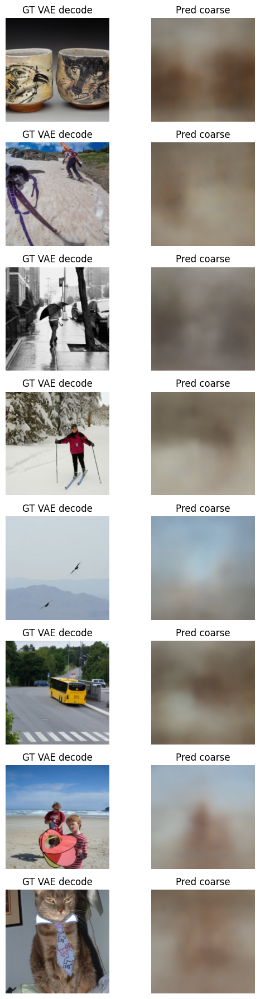

In [23]:
vae = AutoencoderKL.from_pretrained(ll.vae_id).to(device).eval()

coarse = decode_latents_sdvae(Zva_hat[:8], vae)     # predicted
gt     = decode_latents_sdvae(Zva[:8], vae)         # target VAE decode (upper bound of low-level)

vae.to("cpu")
torch.cuda.empty_cache()

import matplotlib.pyplot as plt

fig, axes = plt.subplots(8, 2, figsize=(6, 18))
for i in range(8):
    axes[i,0].imshow(gt[i].permute(1,2,0))
    axes[i,0].set_title("GT VAE decode")
    axes[i,0].axis("off")

    axes[i,1].imshow(coarse[i].permute(1,2,0))
    axes[i,1].set_title("Pred coarse")
    axes[i,1].axis("off")

plt.tight_layout()
plt.show()


## Evaluation metrics (what they actually tell you)

We report multiple metrics because each one can lie in a different way:

- **Latent MSE**: did we match the target representation (good for debugging training).
- **Pixel MSE**: strict per-pixel error after decoding (penalizes small shifts a lot).
- **PSNR**: a re-expression of MSE that is easier to compare across settings.
- **SSIM**: perceptual similarity of local structure (often closer to "looks right" than MSE).


In [24]:
from pytorch_msssim import ssim
import gc

def resize01(images, size):
    x = images.float()
    if x.max() > 1.5:
        x = x / 255.0
    x = x.clamp(0, 1)
    x = torch.nn.functional.interpolate(x, size=(size, size), mode="bilinear", align_corners=False)
    return x

# --- Memory Cleanup ---
gc.collect()
torch.cuda.empty_cache()
# ----------------------

# decode predicted coarse vs original images (resized)
vae = AutoencoderKL.from_pretrained(ll.vae_id).to(device).eval()

# --- FIX: Decode in batches to avoid CUDA OOM ---
pred_imgs = []
batch_size = 20
for i in range(0, len(Zva_hat), batch_size):
    batch_latents = Zva_hat[i : i + batch_size]
    # decode_latents_sdvae handles moving to GPU and back to CPU
    pred_imgs.append(decode_latents_sdvae(batch_latents, vae))

pred_img = torch.cat(pred_imgs, dim=0) # [N,3,256,256] in [0,1]
# ------------------------------------------------

gt_img   = resize01(Iva, ll.img_size)                      # original stimulus resized to 256
vae.to("cpu"); torch.cuda.empty_cache()

latent_mse = torch.mean((Zva_hat - Zva) ** 2).item()
pixel_mse  = torch.mean((pred_img - gt_img) ** 2).item()
pixel_ssim = ssim(pred_img, gt_img, data_range=1.0, size_average=True).item()

print(f"Latent MSE: {latent_mse:.6f}")
print(f"Pixel  MSE: {pixel_mse:.6f}")
print(f"SSIM      : {pixel_ssim:.4f}")

Latent MSE: 0.592225
Pixel  MSE: 0.055255
SSIM      : 0.3951


In [ ]:
# --- Alpha Grid Search (on normalized latent targets) ---
alphas = [10000, 50000, 80000]
best_alpha = None
best_mse = float("inf")

print(f"Searching for best alpha among: {alphas}...")

for a in alphas:
    # Fit Ridge on normalized targets
    ridge_tmp = DualRidge(alpha=a).fit(Xtr, Ytr_n)
    # Predict on Validation (normalized)
    Yva_hat_tmp_n = ridge_tmp.predict(Xva)
    # MSE in normalized space (comparable across dims)
    mse = torch.mean((Yva_hat_tmp_n - Yva_n)**2).item()
    print(f"Alpha: {a:.0f} | Val MSE (norm): {mse:.6f}")
    if mse < best_mse:
        best_mse = mse
        best_alpha = a

print(f"\nBest Alpha: {best_alpha:.0f} (MSE norm: {best_mse:.6f})")

# Re-fit with best alpha
ridge = DualRidge(alpha=best_alpha).fit(Xtr, Ytr_n)
Yva_hat_n = ridge.predict(Xva)
Yva_hat = unnormalize_targets(Yva_hat_n, Ymu, Ysd)
Zva_hat = Yva_hat.view_as(Zva)

# Re-evaluate visual metrics
vae = AutoencoderKL.from_pretrained(ll.vae_id).to(device).eval()
pred_imgs = []
for i in range(0, len(Zva_hat), 20):
    pred_imgs.append(decode_latents_sdvae(Zva_hat[i:i+20], vae))
pred_img = torch.cat(pred_imgs, dim=0)

vae.to("cpu"); torch.cuda.empty_cache()

pixel_ssim = ssim(pred_img, gt_img, data_range=1.0, size_average=True).item()
latent_mse = torch.mean((Zva_hat - Zva) ** 2).item()
print(f"New SSIM with best alpha: {pixel_ssim:.4f}")
print(f"New latent MSE (unnorm): {latent_mse:.6f}")


Searching for best alpha among: [10000, 50000, 80000]...
Alpha: 10000 | Val MSE (norm): 0.922680
Alpha: 50000 | Val MSE (norm): 0.875243
Alpha: 80000 | Val MSE (norm): 0.878445

🏆 Best Alpha: 50000 (MSE norm: 0.875243)
New SSIM with best alpha: 0.3956
New latent MSE (unnorm): 0.587412


In [26]:
out_path = RESULTS_DIR / f"coarse_outputs_subj{ll.subject_id}_sz{ll.img_size}.pt"
torch.save(
    {
        "Xmu": Xmu, "Xsd": Xsd,          # voxel normalization params
        "Xva": Xva, "Tva": Tva,          # validation voxels and trials
        "Zva_hat": Zva_hat,              # predicted latents (scaled)
        "Zva": Zva,                      # target latents (scaled)
        "Iva": Iva,                      # original images (for evaluation)
    },
    out_path
)
print("Saved:", out_path)


Saved: /content/results/coarse_outputs_subj1_sz256.pt


## Part 4: Simple nonlinear decoder (MLP)

**Motivation:** voxel-to-latent mappings can be nonlinear.
An MLP is the simplest way to test whether there is useful nonlinear structure beyond ridge.

**Two changes vs ridge**
- We train on the **expanded repeats** (more samples, more noise, but more supervision).
- We add regularization tricks so the MLP does not just memorize the training set.


In [27]:
@dataclass
class MLPConfig:
    hidden_dims: Tuple[int, ...] = (512, 1024, 2048)         
    dropout: float = 0.35                              
    lr: float = 1e-4                                  
    weight_decay: float = 1e-3                       
    batch_size: int = 128                            
    epochs: int = 100
    patience: int = 25                               
    noise_std: float = 0.06                           
    target_noise: float = 0                        
    mixup_alpha: float = 0.3                        
    grad_weight: float = 0.05                         

mlp_cfg = MLPConfig()
print(mlp_cfg)


MLPConfig(hidden_dims=(512, 1024, 2048), dropout=0.35, lr=0.0001, weight_decay=0.001, batch_size=128, epochs=100, patience=25, noise_std=0.06, target_noise=0, mixup_alpha=0.3, grad_weight=0.05)


### MLP design choices (why these parts exist)

This is not meant to be a "best" architecture. It is meant to be a readable baseline.

- **LayerNorm**: stabilizes training when voxel scales differ across dimensions.
- **Dropout**: reduces overfitting by forcing redundancy in hidden units.
- **ReLU**: standard nonlinearity, cheap and effective.

Losses used in this tutorial:
- **Latent MSE** is the main objective (predict the VAE latent correctly).
- Optional **image-space losses** (after decoding) can reduce high-frequency artifacts, but they are slower.


In [28]:
import torch.nn as nn

class VoxelMLP(nn.Module):
    """Simple MLP that maps voxels → flattened VAE latents."""
    
    def __init__(self, in_dim: int, out_dim: int, hidden_dims: Tuple[int, ...], dropout: float = 0.1):
        super().__init__()
        
        layers = []
        prev_dim = in_dim
        
        for h_dim in hidden_dims:
            layers.extend([
                nn.Linear(prev_dim, h_dim),
                nn.LayerNorm(h_dim),
                nn.GELU(),
                nn.Dropout(dropout),
            ])
            prev_dim = h_dim
        
        # Output projection (no activation)
        layers.append(nn.Linear(prev_dim, out_dim))
        
        self.net = nn.Sequential(*layers)
        self._init_weights()
    
    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)

# Test instantiation
in_dim = Xtr.shape[1]  # Number of voxels
out_dim = Ytr.shape[1]  # Flattened latent dimension
print(f"Input dim (voxels): {in_dim}")
print(f"Output dim (latents): {out_dim}")

model = VoxelMLP(in_dim, out_dim, mlp_cfg.hidden_dims, mlp_cfg.dropout)
print(f"Model params: {sum(p.numel() for p in model.parameters()):,}")


Input dim (voxels): 15724
Output dim (latents): 4096
Model params: 19,075,584


In [ ]:
from torch.utils.data import TensorDataset, DataLoader

def mixup_batch(x: torch.Tensor, y: torch.Tensor, alpha: float = 0.4):
    """Mixup augmentation: blend pairs of samples to create virtual training data."""
    if alpha <= 0:
        return x, y
    lam = np.random.beta(alpha, alpha)
    batch_size = x.size(0)
    index = torch.randperm(batch_size, device=x.device)
    x_mixed = lam * x + (1 - lam) * x[index]
    y_mixed = lam * y + (1 - lam) * y[index]
    return x_mixed, y_mixed

def train_mlp(
    model: nn.Module,
    Xtr: torch.Tensor, Ytr: torch.Tensor,
    Xva: torch.Tensor, Yva: torch.Tensor,
    cfg,
    device: torch.device,
    noise_std: float = 0.1,
    target_noise: float = 0.0,
    mixup_alpha: float = 0.0,
    grad_weight: float = 0.0,
    latent_shape: Optional[Tuple[int, int, int]] = None,
):
    """
    Train MLP with strong regularization to prevent overfitting:
    - Input noise on voxels
    - Target noise (label smoothing effect)
    - Mixup augmentation
    - High dropout + weight decay
    - Simple cosine LR decay (no restarts)
    """
    
    model = model.to(device)
    
    base_lr = float(getattr(cfg, 'lr', 1e-4))
    optimizer = torch.optim.AdamW(model.parameters(), lr=base_lr, weight_decay=cfg.weight_decay)
    
    # Simple cosine decay (no restarts - they can hurt when overfitting)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=cfg.epochs, eta_min=base_lr * 0.01)
    
    # Create dataloaders
    train_ds = TensorDataset(Xtr, Ytr)
    default_workers = 0 if os.name == "nt" else 2
    num_workers = int(getattr(cfg, "num_workers", default_workers))
    train_loader = DataLoader(
        train_ds,
        batch_size=cfg.batch_size,
        shuffle=True,
        pin_memory=(device.type == "cuda"),
        num_workers=num_workers,
        persistent_workers=(num_workers > 0) if num_workers > 0 else False,
    )
    
    # Cache validation tensors on device
    Xva_dev = Xva.to(device)
    Yva_dev = Yva.to(device)
    
    best_val_loss = float('inf')
    best_state = None
    patience_counter = 0
    history = {'train_loss': [], 'val_loss': [], 'lr': []}
    
    pbar = tqdm(range(cfg.epochs), desc="Training MLP")
    
    for epoch in pbar:
        model.train()
        train_losses = []
        
        for xb, yb in train_loader:
            xb, yb = xb.to(device, non_blocking=True), yb.to(device, non_blocking=True)
            
            # 1. Mixup augmentation (creates virtual samples)
            if mixup_alpha > 0:
                xb, yb = mixup_batch(xb, yb, alpha=mixup_alpha)
            
            # 2. Add noise to inputs (regularization)
            if noise_std > 0:
                xb = xb + torch.randn_like(xb) * noise_std
            
            # 3. Add noise to targets (label smoothing effect)
            if target_noise > 0:
                yb = yb + torch.randn_like(yb) * target_noise
            
            optimizer.zero_grad(set_to_none=True)
            pred = model(xb)
            loss = F.mse_loss(pred, yb)
            if grad_weight > 0 and latent_shape is not None:
                loss = loss + latent_spatial_grad_loss(pred, yb, latent_shape=latent_shape, weight=grad_weight)
            loss.backward()
            
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            train_losses.append(loss.item())
        
        scheduler.step()
        current_lr = optimizer.param_groups[0]['lr']
        avg_train_loss = float(np.mean(train_losses))
        
        # Validation (no augmentation)
        model.eval()
        with torch.no_grad():
            pred_va = model(Xva_dev)
            val_loss = F.mse_loss(pred_va, Yva_dev).item()
        
        history['train_loss'].append(avg_train_loss)
        history['val_loss'].append(val_loss)
        history['lr'].append(current_lr)
        
        # Track gap to monitor overfitting
        gap = avg_train_loss - val_loss
        pbar.set_postfix({'train': f'{avg_train_loss:.4f}', 'val': f'{val_loss:.4f}', 'gap': f'{gap:.4f}'})
        
        # Early Stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= cfg.patience:
                print(f"\nEarly stopping at epoch {epoch+1}")
                break
    
    model.load_state_dict(best_state)
    model.eval()
    
    print(f"Best val loss: {best_val_loss:.6f}")
    return model, history


### Training loop and early stopping

Neural decoders love to overfit fMRI.
We use validation performance to decide when to stop training.

Minimal checklist:
- shuffle training batches
- evaluate on val every epoch
- keep the best checkpoint by validation loss
- stop if validation loss stops improving

This keeps the tutorial honest: the reported numbers reflect generalization, not memorization.

**Each Epoch**:
1. Apply data augmentation (mixup, noise) to training batches
2. Forward pass through model
3. Compute loss (MSE + optional spatial gradient loss)
4. Backward pass and gradient update
5. Evaluate on validation set (no augmentation)

**Early Stopping**: 
- Tracks best validation loss seen so far
- If validation loss doesn't improve for `patience` epochs, training stops
- Prevents overfitting by stopping when model starts memorizing training data

**Learning Rate Schedule**:
- Cosine annealing: Gradually decreases learning rate from initial value to 1% of initial
- Smooth decay helps fine-tune weights without large jumps
- No restarts (which can hurt when data is limited)

**Gradient Clipping**: Limits gradient magnitude to prevent exploding gradients, which is especially important with high dropout rates.


### Training the MLP

We fit the MLP on the expanded training set and evaluate on validation.
After training, we compare ridge vs MLP in:
- latent error (are we predicting the representation)
- decoded image metrics (do reconstructions look better)

Expectation management:
- Gains can be small.
- Sometimes MLP improves SSIM but worsens pixel MSE, or vice versa.
That usually reflects different error modes, not a contradiction.


Latent shape: (4, 32, 32)
Training target space: normalized latents
Config: MLPConfig(hidden_dims=(512, 1024, 2048), dropout=0.35, lr=0.0001, weight_decay=0.001, batch_size=128, epochs=100, patience=25, noise_std=0.06, target_noise=0, mixup_alpha=0.3, grad_weight=0.05)
Model params: 19,075,584
Training with EXPANDED data: 25920 samples
Regularization: noise=0.06, target_noise=0, mixup=0.3


Training MLP:   0%|          | 0/100 [00:00<?, ?it/s]


⏹️ Early stopping at epoch 69
✅ Best val loss: 0.848081


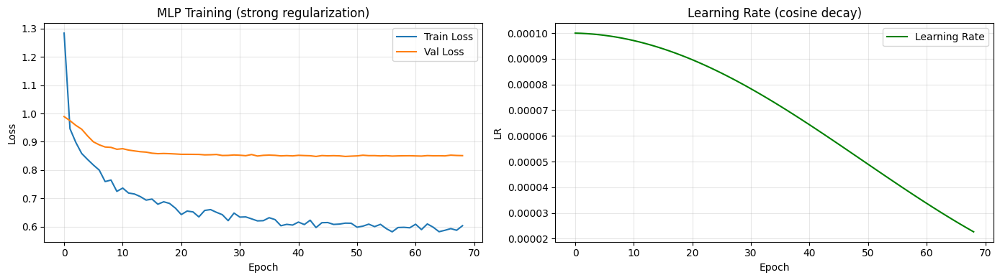

In [30]:
# Train Simple MLP with strong regularization
set_seed(ll.seed)

latent_shape = (int(Ztr.shape[1]), int(Ztr.shape[2]), int(Ztr.shape[3]))
print("Latent shape:", latent_shape)

# Use EXPANDED data for MLP training (3x samples!)
Ytr_exp_mlp = Ztr_exp.flatten(1).float()
Ytr_exp_mlp_n = (Ytr_exp_mlp - Ymu) / Ysd
print("Training target space: normalized latents")

model = VoxelMLP(in_dim, out_dim, mlp_cfg.hidden_dims, mlp_cfg.dropout)
print(f"Config: {mlp_cfg}")
print(f"Model params: {sum(p.numel() for p in model.parameters()):,}")
print(f"Training with EXPANDED data: {Xtr_exp.shape[0]} samples")
print(f"Regularization: noise={mlp_cfg.noise_std}, target_noise={mlp_cfg.target_noise}, mixup={mlp_cfg.mixup_alpha}")

model, history = train_mlp(
    model,
    Xtr_exp, Ytr_exp_mlp_n,
    Xva, Yva_n,
    mlp_cfg, device,
    noise_std=mlp_cfg.noise_std,
    target_noise=getattr(mlp_cfg, 'target_noise', 0.0),
    mixup_alpha=getattr(mlp_cfg, 'mixup_alpha', 0.0),
    grad_weight=mlp_cfg.grad_weight,
    latent_shape=latent_shape,
)

# Plot training curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
ax1.plot(history['train_loss'], label='Train Loss')
ax1.plot(history['val_loss'], label='Val Loss')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.set_title('MLP Training (strong regularization)')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(history['lr'], label='Learning Rate', color='green')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('LR')
ax2.set_title('Learning Rate (cosine decay)')
ax2.legend()
ax2.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [31]:
# Generate MLP predictions (in normalized latent space)
model.eval()
with torch.no_grad():
    Yva_hat_mlp_n = model(Xva.to(device)).cpu()

# Unnormalize for decoding/metrics
Yva_hat_mlp = unnormalize_targets(Yva_hat_mlp_n, Ymu, Ysd)
Zva_hat_mlp = Yva_hat_mlp.view_as(Zva)

print("MLP predicted latents:")
print(f"  mean: {Zva_hat_mlp.mean().item():.4f}, std: {Zva_hat_mlp.std().item():.4f}")
print(f"  GT mean: {Zva.mean().item():.4f}, GT std: {Zva.std().item():.4f}")


MLP predicted latents:
  mean: 0.0624, std: 0.3811
  GT mean: 0.0643, GT std: 0.8281


In [ ]:
# Decode MLP predictions and evaluate
vae = AutoencoderKL.from_pretrained(ll.vae_id).to(device).eval()

pred_imgs_mlp = []
for i in range(0, len(Zva_hat_mlp), 20):
    pred_imgs_mlp.append(decode_latents_sdvae(Zva_hat_mlp[i:i+20], vae))
pred_img_mlp = torch.cat(pred_imgs_mlp, dim=0)

vae.to("cpu"); torch.cuda.empty_cache()

# Compute metrics (pixel SSIM is against resized original images)
latent_mse_mlp = torch.mean((Zva_hat_mlp - Zva) ** 2).item()
pixel_mse_mlp = torch.mean((pred_img_mlp - gt_img) ** 2).item()
pixel_ssim_mlp = ssim(pred_img_mlp, gt_img, data_range=1.0, size_average=True).item()

print("\nMLP Results:")
print(f"  Latent MSE: {latent_mse_mlp:.6f}")
print(f"  Pixel  MSE: {pixel_mse_mlp:.6f}")
print(f"  SSIM      : {pixel_ssim_mlp:.4f}")

print("\nRidge Results (for comparison):")
print(f"  Latent MSE: {latent_mse:.6f}")
print(f"  SSIM      : {pixel_ssim:.4f}")

improvement = (pixel_ssim_mlp - pixel_ssim) / max(pixel_ssim, 1e-8) * 100
print(f"\nSSIM change vs Ridge: {improvement:+.2f}%")



📊 MLP Results:
  Latent MSE: 0.567733
  Pixel  MSE: 0.052693
  SSIM      : 0.4053

📊 Ridge Results (for comparison):
  Latent MSE: 0.587412
  SSIM      : 0.3956

SSIM change vs Ridge: +2.44%


### Summary: validation comparison (what we learned)

**Ridge**
- linear baseline, strong and stable
- fast to fit and easy to interpret
- uses repeat-averaged targets in this tutorial

**MLP**
- nonlinear baseline, can capture interactions
- needs regularization and early stopping
- uses repeat-expanded data, so it has more samples but also more noise

Next step: run the same comparison on the **held-out test set** and save qualitative examples.


In [ ]:
# --- Summary ---
print("=" * 60)
print("LOW-LEVEL BRAIN DECODING SUMMARY")
print("=" * 60)
print()
print("Approach: Decode VAE latents from fMRI voxels")
print(f"Subject: {ll.subject_id}")
print(f"Train samples: {len(Xtr)}")
print(f"Val samples: {len(Xva)}")
print()
print("MODELS:")
print(f"  1. Ridge Regression (alpha={ll.ridge_alpha:.0f})")
print(f"  2. MLP (neural network)")
print()
print("VALIDATION RESULTS:")
print(f"  Ridge:  SSIM = {pixel_ssim:.4f}")
print(f"  MLP:    SSIM = {pixel_ssim_mlp:.4f}")
print()
improvement = (pixel_ssim_mlp - pixel_ssim) / max(pixel_ssim, 1e-8) * 100
print(f"MLP improvement over Ridge: {improvement:+.2f}%")
print("=" * 60)


📋 LOW-LEVEL BRAIN DECODING SUMMARY

Approach: Decode VAE latents from fMRI voxels
Subject: 1
Train samples: 8640
Val samples: 300

MODELS:
  1. Ridge Regression (α=100000)
  2. Simple MLP
  4. RidgePlusMLP

RESULTS:
  Ridge:        SSIM = 0.3956
  Simple MLP:   SSIM = 0.4053
  RidgePlusMLP: SSIM = 0.4016

🏆 Best: RidgePlusMLP (+1.5% over Ridge)


## Part 5: Final test set evaluation

The test set contains images never used during training or model selection.
This is the only place where you should report "final" metrics.

We will:
- decode ridge and MLP predictions back to images
- compute SSIM, PSNR, and MSE over all test samples
- visualize a small grid of reconstructions for qualitative sanity checks


In [ ]:
# =============================================================================
# TEST SET EVALUATION: Quantitative Metrics (All Test Samples)
# =============================================================================

from pytorch_msssim import ssim as compute_ssim
import torch.nn.functional as F
import gc

print("Evaluating on TEST SET (unseen data)")
print(f"   Test samples: {len(Xte)}")

# --- Generate predictions on TEST set ---
print("\nGenerating Ridge predictions on test set...")
Yte_ridge = ridge.predict(Xte)  # Normalized predictions
Yte_ridge_unnorm = unnormalize_targets(torch.tensor(Yte_ridge).float(), Ymu, Ysd)
Zte_hat_ridge = Yte_ridge_unnorm.view(-1, *Zte.shape[1:])  # Reshape to latent dims

print("Generating MLP predictions on test set...")
model.eval()
with torch.no_grad():
    Yte_hat_mlp_n = model(Xte.to(device)).cpu()
Yte_hat_mlp = unnormalize_targets(Yte_hat_mlp_n, Ymu, Ysd)
Zte_hat_mlp = Yte_hat_mlp.view(-1, *Zte.shape[1:])

# --- Decode predictions to images ---
print("Decoding predictions to images...")
vae = AutoencoderKL.from_pretrained(ll.vae_id).to(device).eval()

# Decode Ridge predictions
pred_imgs_ridge_te = []
for i in range(0, len(Zte_hat_ridge), 20):
    pred_imgs_ridge_te.append(decode_latents_sdvae(Zte_hat_ridge[i:i+20], vae))
    torch.cuda.empty_cache()
pred_img_te_ridge = torch.cat(pred_imgs_ridge_te, dim=0)

# Decode MLP predictions  
pred_imgs_mlp_te = []
for i in range(0, len(Zte_hat_mlp), 20):
    pred_imgs_mlp_te.append(decode_latents_sdvae(Zte_hat_mlp[i:i+20], vae))
    torch.cuda.empty_cache()
pred_img_te_mlp = torch.cat(pred_imgs_mlp_te, dim=0)

# Decode ground truth test latents
print("Decoding ground truth test latents...")
gt_imgs_te = []
for i in range(0, len(Zte), 20):
    gt_imgs_te.append(decode_latents_sdvae(Zte[i:i+20], vae))
    torch.cuda.empty_cache()
gt_img_te = torch.cat(gt_imgs_te, dim=0)

vae.to("cpu")
del vae
gc.collect()
torch.cuda.empty_cache()

print(f"Decoded {len(gt_img_te)} test images")

# --- Compute metrics over ALL test samples ---
def compute_metrics(pred, gt):
    """Compute SSIM, PSNR, MSE for a single sample."""
    pred = pred.unsqueeze(0).clamp(0, 1)
    gt = gt.unsqueeze(0).clamp(0, 1)
    ssim_val = compute_ssim(pred, gt, data_range=1.0, size_average=True).item()
    mse_val = F.mse_loss(pred, gt).item()
    psnr_val = 10 * np.log10(1.0 / max(mse_val, 1e-10))
    return ssim_val, psnr_val, mse_val

print("\nComputing metrics over ALL test samples...")
all_metrics = []
for idx in tqdm(range(len(gt_img_te)), desc="Computing metrics"):
    ridge_ssim, ridge_psnr, ridge_mse = compute_metrics(pred_img_te_ridge[idx], gt_img_te[idx])
    mlp_ssim, mlp_psnr, mlp_mse = compute_metrics(pred_img_te_mlp[idx], gt_img_te[idx])
    all_metrics.append({
        'idx': idx,
        'ridge_ssim': ridge_ssim, 'ridge_psnr': ridge_psnr, 'ridge_mse': ridge_mse,
        'mlp_ssim': mlp_ssim, 'mlp_psnr': mlp_psnr, 'mlp_mse': mlp_mse
    })

# --- Print Summary Metrics (ALL samples) ---
ridge_ssims = np.array([m['ridge_ssim'] for m in all_metrics])
mlp_ssims = np.array([m['mlp_ssim'] for m in all_metrics])
ridge_psnrs = np.array([m['ridge_psnr'] for m in all_metrics])
mlp_psnrs = np.array([m['mlp_psnr'] for m in all_metrics])
ridge_mses = np.array([m['ridge_mse'] for m in all_metrics])
mlp_mses = np.array([m['mlp_mse'] for m in all_metrics])

print("\n" + "=" * 70)
print(f"TEST SET METRICS (All {len(gt_img_te)} Samples)")
print("=" * 70)
print(f"{'Metric':<12} {'Ridge':<25} {'Simple MLP':<25}")
print("-" * 70)
print(f"{'SSIM ↑':<12} {ridge_ssims.mean():.4f} ± {ridge_ssims.std():.4f}        {mlp_ssims.mean():.4f} ± {mlp_ssims.std():.4f}")
print(f"{'PSNR ↑':<12} {ridge_psnrs.mean():.2f} ± {ridge_psnrs.std():.2f} dB       {mlp_psnrs.mean():.2f} ± {mlp_psnrs.std():.2f} dB")
print(f"{'MSE ↓':<12} {ridge_mses.mean():.5f} ± {ridge_mses.std():.5f}    {mlp_mses.mean():.5f} ± {mlp_mses.std():.5f}")
print("=" * 70)

# Compute improvement
ssim_diff = mlp_ssims.mean() - ridge_ssims.mean()
ssim_pct = ssim_diff / ridge_ssims.mean() * 100
print(f"\nMLP vs Ridge: SSIM {ssim_diff:+.4f} ({ssim_pct:+.2f}%)")
print(f"   MLP wins on {np.sum(mlp_ssims > ridge_ssims)}/{len(mlp_ssims)} samples ({np.sum(mlp_ssims > ridge_ssims)/len(mlp_ssims)*100:.1f}%)")


🧪 Evaluating on TEST SET (unseen data)
   Test samples: 1000

📊 Generating Ridge predictions on test set...


/tmp/ipython-input-1851814994.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Yte_ridge_unnorm = unnormalize_targets(torch.tensor(Yte_ridge).float(), Ymu, Ysd)


📊 Generating MLP predictions on test set...
🖼️ Decoding predictions to images...
🖼️ Decoding ground truth test latents...
✅ Decoded 1000 test images

📊 Computing metrics over ALL test samples...


Computing metrics:   0%|          | 0/1000 [00:00<?, ?it/s]


📊 TEST SET METRICS (All 1000 Samples)
Metric       Ridge                     Simple MLP               
----------------------------------------------------------------------
SSIM ↑       0.4351 ± 0.1403        0.4435 ± 0.1413
PSNR ↑       13.29 ± 1.82 dB       13.31 ± 1.81 dB
MSE ↓        0.05094 ± 0.02029    0.05073 ± 0.02084

🏆 MLP vs Ridge: SSIM +0.0085 (+1.94%)
   MLP wins on 713/1000 samples (71.3%)


### Visual comparison (do the images make sense?)

Metrics are useful, but reconstructions can fail in ways metrics do not capture.
Always inspect a handful of examples:
- do edges roughly align
- are colors plausible
- does the reconstruction collapse to an average-looking image

When ridge and MLP differ, look for *systematic* differences, not one lucky example.


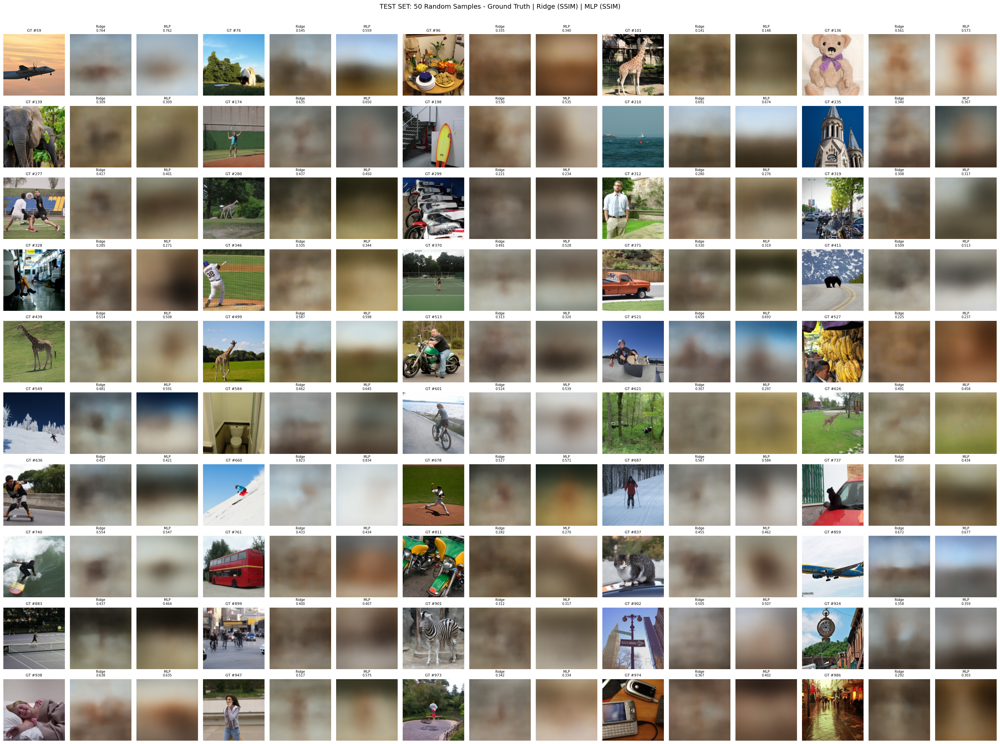

✅ Displayed 50 randomly selected TEST reconstructions


In [ ]:
# =============================================================================
# TEST SET: 50 Random Sample Reconstructions
# =============================================================================

# Select 50 random samples from TEST set
np.random.seed(42)
n_samples = min(50, len(gt_img_te))
random_indices = np.random.choice(len(gt_img_te), size=n_samples, replace=False)
random_indices = np.sort(random_indices)

# Get metrics for selected samples
metrics_50 = [all_metrics[idx] for idx in random_indices]

# --- Visualization: 50 samples in a grid (10 rows x 5 samples per row) ---
# Each sample shows: Ground Truth | Ridge | MLP
samples_per_row = 5
n_rows = (n_samples + samples_per_row - 1) // samples_per_row

fig, axes = plt.subplots(n_rows, samples_per_row * 3, figsize=(samples_per_row * 6, n_rows * 2.2))

for i, idx in enumerate(random_indices):
    row = i // samples_per_row
    col_base = (i % samples_per_row) * 3
    
    m = metrics_50[i]
    
    # Ground Truth
    ax_gt = axes[row, col_base]
    ax_gt.imshow(gt_img_te[idx].permute(1, 2, 0).clamp(0, 1).cpu())
    ax_gt.set_title(f"GT #{idx}", fontsize=8)
    ax_gt.axis('off')
    
    # Ridge
    ax_ridge = axes[row, col_base + 1]
    ax_ridge.imshow(pred_img_te_ridge[idx].permute(1, 2, 0).clamp(0, 1).cpu())
    ax_ridge.set_title(f"Ridge\n{m['ridge_ssim']:.3f}", fontsize=7)
    ax_ridge.axis('off')
    
    # MLP
    ax_mlp = axes[row, col_base + 2]
    ax_mlp.imshow(pred_img_te_mlp[idx].permute(1, 2, 0).clamp(0, 1).cpu())
    ax_mlp.set_title(f"MLP\n{m['mlp_ssim']:.3f}", fontsize=7)
    ax_mlp.axis('off')

# Hide any unused axes
for i in range(len(random_indices), n_rows * samples_per_row):
    row = i // samples_per_row
    col_base = (i % samples_per_row) * 3
    for j in range(3):
        axes[row, col_base + j].axis('off')

plt.suptitle("TEST SET: 50 Random Samples - Ground Truth | Ridge (SSIM) | MLP (SSIM)", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

print(f"Displayed {n_samples} randomly selected TEST reconstructions")
